In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

In [14]:
file_path_treatment = '/content/drive/MyDrive/Side effect dataset/plco_treatment.csv'

In [15]:
file_path_complication = '/content/drive/MyDrive/Side effect dataset/plco_complication.csv'

In [16]:
file_path_screening = '/content/drive/MyDrive/Side effect dataset/screening.csv'

In [17]:
file_path_diagnostic= '/content/drive/MyDrive/Side effect dataset/Diagnostic.csv'

In [18]:
file_path_abnormalities = '/content/drive/MyDrive/Side effect dataset/abnormalities.csv'

In [19]:
file_path_overall = '/content/drive/MyDrive/Side effect dataset/lung_data_mar22_d032222.csv'

In [20]:
data_treatment = pd.read_csv(file_path_treatment)

In [21]:
data_complication = pd.read_csv(file_path_complication)

In [22]:
data_complication

,ctypel,study_yr,ctype_catl,primary_number,ctypel_mod,plco_id,build,build_cancers,build_incidence_cutoff,med_days
0,3,10,2,1.0,3,A-013778-8,mar22/03.22.22,1,1,3479
1,9,10,3,1.0,9,A-013778-8,mar22/03.22.22,1,1,3496
2,25,10,2,1.0,25,A-013778-8,mar22/03.22.22,1,1,3503
3,1,3,2,1.0,423,A-015992-2,mar22/03.22.22,1,1,994
4,201,3,2,1.0,201,A-015992-2,mar22/03.22.22,1,1,995
...,...,...,...,...,...,...,...,...,...,...
1498,31,4,1,1.0,31,Z-146473-4,mar22/03.22.22,1,1,1076
1499,25,6,2,1.0,25,Z-149137-3,mar22/03.22.22,1,1,540
1500,9,1,3,1.0,9,Z-159307-0,mar22/03.22.22,1,1,488
1501,3,1,2,1.0,3,Z-159307-0,mar22/03.22.22,1,1,489


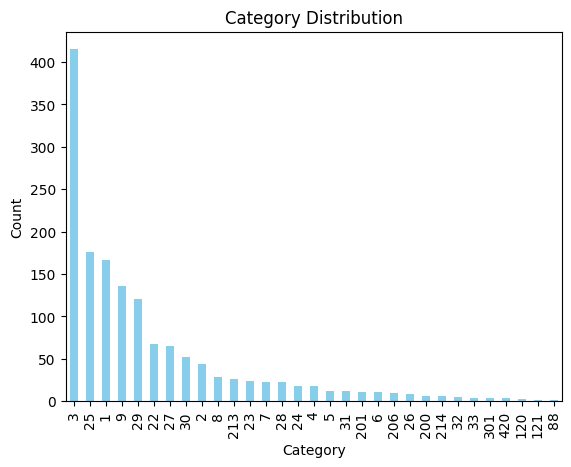

In [23]:
# Count values per category
category_counts = data_complication['ctypel'].value_counts()

# Plot bar chart
category_counts.plot(kind='bar', color='skyblue')
plt.xlabel("Category")
plt.ylabel("Count")
plt.title("Category Distribution")
plt.show()

In [24]:
data_complication['ctypel'].value_counts()


,count
ctypel,
3,415
25,176
1,167
9,136
29,120
22,68
27,65
30,52
2,44


In [25]:
file_path_treatment = '/content/drive/MyDrive/Side effect dataset/plco_treatment.csv'

In [28]:
file_path_complication = '/content/drive/MyDrive/Side effect dataset/plco_complication.csv'

In [27]:
file_path_screening = '/content/drive/MyDrive/Side effect dataset/screening.csv'

In [26]:
file_path_diagnostic= '/content/drive/MyDrive/Side effect dataset/Diagnostic.csv'

In [29]:
file_path_abnormalities = '/content/drive/MyDrive/Side effect dataset/abnormalities.csv'

In [30]:
file_path_overall = '/content/drive/MyDrive/Side effect dataset/lung_data_mar22_d032222.csv'

In [31]:
data_treatment = pd.read_csv(file_path_treatment)

In [32]:
data_complication = pd.read_csv(file_path_complication)

In [34]:
data_screening = pd.read_csv(file_path_screening, dtype='unicode') #file = pd.read_csv(args.input_file, dtype='unicode'dtype='unicode')

In [35]:
data_diagnostic = pd.read_csv(file_path_diagnostic)

In [36]:
data_abnormalities = pd.read_csv(file_path_abnormalities)

In [37]:
primary = pd.read_csv(file_path_overall)

In [38]:
# Step 1: Start with the primary dataset
merged_data = primary

In [39]:
merged_data

,reasfolll,reassympl,reassurvl,reasothl,num_cancl,lung_cancer,intstatl_cat,lung_stage,lung_stage_7e,lung_stage_t,...,sex,age,agelevel,dual,reconsent_outcome,reconsent_outcome_days,fstcan_exitstat,fstcan_exitage,fstcan_exitdays,in_TGWAS_population
0,NaN,NaN,NaN,NaN,0,0,0,NaN,NaN,NaN,...,1,67,2,1,2,5336,8,80,4794,1
1,NaN,NaN,NaN,NaN,0,0,0,NaN,NaN,NaN,...,1,62,1,0,1,4759,8,72,3873,1
2,NaN,NaN,NaN,NaN,0,0,0,NaN,NaN,NaN,...,1,62,1,0,1,4658,8,74,4123,0
3,NaN,NaN,NaN,NaN,0,0,0,NaN,NaN,NaN,...,2,74,3,0,5,5621,8,87,4672,1
4,NaN,NaN,NaN,NaN,0,0,0,NaN,NaN,NaN,...,2,63,1,0,1,4106,8,72,3386,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154882,NaN,NaN,NaN,NaN,0,0,0,NaN,NaN,NaN,...,1,58,0,0,1,4767,8,69,4207,1
154883,NaN,NaN,NaN,NaN,0,0,0,NaN,NaN,NaN,...,1,62,1,0,3,6054,1,73,3994,1
154884,NaN,NaN,NaN,NaN,0,0,0,NaN,NaN,NaN,...,1,72,3,0,12,2152,5,78,2152,0
154885,0.0,0.0,NaN,1.0,1,1,1,110.0,110.0,100.0,...,2,62,1,0,12,4524,1,63,250,0


In [40]:

# Step 2: Merge data_screening
merged_data2 = pd.merge(merged_data, data_complication, on='plco_id', how='inner')


In [ ]:
merged_data2

,reasfolll,reassympl,reassurvl,reasothl,num_cancl,lung_cancer,intstatl_cat,lung_stage,lung_stage_7e,lung_stage_t,...,in_TGWAS_population,ctypel,study_yr,ctype_catl,primary_number,ctypel_mod,build_y,build_cancers_y,build_incidence_cutoff_y,med_days
0,0.0,0.0,NaN,1.0,1,1,3,220.0,220.0,300.0,...,1,3,10,2,1.0,3,mar22/03.22.22,1,1,3479
1,0.0,0.0,NaN,1.0,1,1,3,220.0,220.0,300.0,...,1,9,10,3,1.0,9,mar22/03.22.22,1,1,3496
2,0.0,0.0,NaN,1.0,1,1,3,220.0,220.0,300.0,...,1,25,10,2,1.0,25,mar22/03.22.22,1,1,3503
3,0.0,1.0,0.0,0.0,1,1,4,210.0,210.0,100.0,...,1,1,3,2,1.0,423,mar22/03.22.22,1,1,994
4,0.0,1.0,0.0,0.0,1,1,4,210.0,210.0,100.0,...,1,201,3,2,1.0,201,mar22/03.22.22,1,1,995
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1498,0.0,0.0,NaN,1.0,1,1,1,400.0,400.0,400.0,...,0,31,4,1,1.0,31,mar22/03.22.22,1,1,1076
1499,0.0,1.0,NaN,0.0,1,1,1,310.0,310.0,300.0,...,0,25,6,2,1.0,25,mar22/03.22.22,1,1,540
1500,1.0,0.0,NaN,0.0,1,1,5,110.0,110.0,100.0,...,1,9,1,3,1.0,9,mar22/03.22.22,1,1,488
1501,1.0,0.0,NaN,0.0,1,1,5,110.0,110.0,100.0,...,1,3,1,2,1.0,3,mar22/03.22.22,1,1,489


In [41]:

# Step 3: Merge data_abnormalities
merged_data3 = pd.merge(merged_data2, data_abnormalities, on='plco_id', how='inner')




In [42]:
merged_data3

,reasfolll,reassympl,reassurvl,reasothl,num_cancl,lung_cancer,intstatl_cat,lung_stage,lung_stage_7e,lung_stage_t,...,LOCL6,LOCL7,LOCL8,study_yr_y,sbcd,ftype,source,build,build_cancers,build_incidence_cutoff
0,0.0,0.0,NaN,1.0,1,1,3,220.0,220.0,300.0,...,NaN,NaN,NaN,0,1,202,XY,mar22/03.22.22,1,1
1,0.0,0.0,NaN,1.0,1,1,3,220.0,220.0,300.0,...,NaN,1.0,NaN,0,2,202,XY,mar22/03.22.22,1,1
2,0.0,0.0,NaN,1.0,1,1,3,220.0,220.0,300.0,...,NaN,NaN,1.0,1,1,202,XY,mar22/03.22.22,1,1
3,0.0,0.0,NaN,1.0,1,1,3,220.0,220.0,300.0,...,NaN,NaN,1.0,1,2,202,XY,mar22/03.22.22,1,1
4,0.0,0.0,NaN,1.0,1,1,3,220.0,220.0,300.0,...,NaN,NaN,NaN,0,1,202,XY,mar22/03.22.22,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2401,1.0,0.0,0.0,0.0,1,1,5,120.0,120.0,200.0,...,NaN,NaN,1.0,0,1,202,XY,mar22/03.22.22,1,1
2402,1.0,0.0,NaN,0.0,1,1,5,110.0,110.0,100.0,...,1.0,NaN,NaN,0,1,202,XY,mar22/03.22.22,1,1
2403,1.0,0.0,NaN,0.0,1,1,5,110.0,110.0,100.0,...,NaN,NaN,NaN,1,1,202,XY,mar22/03.22.22,1,1
2404,1.0,0.0,NaN,0.0,1,1,5,110.0,110.0,100.0,...,1.0,NaN,NaN,0,1,202,XY,mar22/03.22.22,1,1


In [43]:
columns_to_drop = [
    'build_x', 'build_cancers_x', 'build_incidence_cutoff_x',
    'build_death_cutoff', 'build_y', 'build_cancers_y',
    'build_incidence_cutoff_y', 'build', 'build_cancers',
    'build_incidence_cutoff'
]

In [44]:
merged_data3 = merged_data3.drop(columns=columns_to_drop, axis=1)

In [45]:
data_diagnostic

,proc_numl,proc_res,proc_catl,scr_link,diag_stag,biop,bxintent,link_yr,intstatl_cat_link,del_invas_cat,plco_id,build,build_cancers,build_incidence_cutoff,proc_days
0,94,NaN,1,1,1,0,0,1.0,0,13,A-000899-7,mar22/03.22.22,1,1,396
1,45,NaN,1,1,1,0,0,3.0,0,13,A-000899-7,mar22/03.22.22,1,1,1087
2,2,2.0,3,1,1,0,0,1.0,0,12,A-004679-9,mar22/03.22.22,1,1,419
3,29,2.0,1,1,1,0,0,1.0,0,13,A-004679-9,mar22/03.22.22,1,1,419
4,2,3.0,3,1,1,0,0,0.0,0,12,A-004868-8,mar22/03.22.22,1,1,69
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64296,6,NaN,4,0,3,0,0,6.0,1,11,Z-162367-9,mar22/03.22.22,1,1,2174
64297,24,NaN,7,0,3,0,0,6.0,1,1,Z-162367-9,mar22/03.22.22,1,1,2195
64298,26,NaN,6,0,1,1,1,6.0,1,5,Z-162367-9,mar22/03.22.22,1,1,2195
64299,27,NaN,7,0,3,0,7,6.0,1,3,Z-162367-9,mar22/03.22.22,1,1,2195


In [46]:
# Find duplicate rows
duplicate_rows_data_diagnostic = data_diagnostic[data_diagnostic.duplicated(keep=False)]  # 'keep=False' marks all duplicates



In [47]:
duplicate_rows_data_diagnostic

,proc_numl,proc_res,proc_catl,scr_link,diag_stag,biop,bxintent,link_yr,intstatl_cat_link,del_invas_cat,plco_id,build,build_cancers,build_incidence_cutoff,proc_days
959,83,NaN,6,0,2,0,6,4.0,1,5,A-058391-5,mar22/03.22.22,1,1,1556
960,83,NaN,6,0,2,0,6,4.0,1,5,A-058391-5,mar22/03.22.22,1,1,1556
8796,8,NaN,4,0,2,0,6,3.0,2,94,D-025967-3,mar22/03.22.22,1,1,1368
8797,8,NaN,4,0,2,0,6,3.0,2,94,D-025967-3,mar22/03.22.22,1,1,1368
17228,23,NaN,6,0,2,0,6,14.0,3,15,H-149649-8,mar22/03.22.22,1,1,5347
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59649,23,NaN,6,0,3,1,1,5.0,1,15,Y-106089-7,mar22/03.22.22,1,1,1938
63642,37,NaN,6,1,2,0,6,3.0,5,15,Z-133666-0,mar22/03.22.22,1,1,1273
63651,37,NaN,6,1,2,0,6,3.0,5,15,Z-133666-0,mar22/03.22.22,1,1,1273
63979,8,NaN,4,0,2,0,6,NaN,0,94,Z-147841-2,mar22/03.22.22,1,1,4771


In [48]:
duplicate_rows_data_diagnostic.sum()

,0
proc_numl,1776
proc_res,903.0
proc_catl,314
scr_link,17
diag_stag,132
biop,12
bxintent,228
link_yr,270.0
intstatl_cat_link,141
del_invas_cat,1612


In [49]:
# Remove duplicate rows, keeping only the first occurrence
data_diagnostic = data_diagnostic.drop_duplicates()

In [50]:
# Count occurrences of values in column 'A'
value_counts = data_diagnostic['plco_id'].value_counts()

In [51]:
value_counts

,count
plco_id,
X-064229-0,31
X-055751-4,27
X-142880-5,26
Q-112246-5,26
Y-040488-0,25
...,...
Z-157471-5,1
Z-157363-4,1
Z-157246-2,1


In [52]:
merged_data4 = pd.merge(merged_data3, data_diagnostic, on='plco_id', how='inner')

In [53]:
merged_data4

,reasfolll,reassympl,reassurvl,reasothl,num_cancl,lung_cancer,intstatl_cat,lung_stage,lung_stage_7e,lung_stage_t,...,diag_stag,biop,bxintent,link_yr,intstatl_cat_link,del_invas_cat,build,build_cancers,build_incidence_cutoff,proc_days
0,0.0,0.0,NaN,1.0,1,1,3,220.0,220.0,300.0,...,1,0,0,9.0,3,14,mar22/03.22.22,1,1,3472
1,0.0,0.0,NaN,1.0,1,1,3,220.0,220.0,300.0,...,2,0,6,9.0,3,94,mar22/03.22.22,1,1,3483
2,0.0,0.0,NaN,1.0,1,1,3,220.0,220.0,300.0,...,1,0,0,9.0,3,94,mar22/03.22.22,1,1,3472
3,0.0,0.0,NaN,1.0,1,1,3,220.0,220.0,300.0,...,2,0,6,9.0,3,1,mar22/03.22.22,1,1,3496
4,0.0,0.0,NaN,1.0,1,1,3,220.0,220.0,300.0,...,2,0,7,9.0,3,3,mar22/03.22.22,1,1,3496
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26771,1.0,0.0,NaN,0.0,1,1,5,110.0,110.0,100.0,...,3,0,0,1.0,5,1,mar22/03.22.22,1,1,488
26772,1.0,0.0,NaN,0.0,1,1,5,110.0,110.0,100.0,...,3,0,7,1.0,5,3,mar22/03.22.22,1,1,488
26773,1.0,0.0,NaN,0.0,1,1,5,110.0,110.0,100.0,...,3,0,6,1.0,5,15,mar22/03.22.22,1,1,488
26774,1.0,0.0,NaN,0.0,1,1,5,110.0,110.0,100.0,...,1,0,0,1.0,5,13,mar22/03.22.22,1,1,413


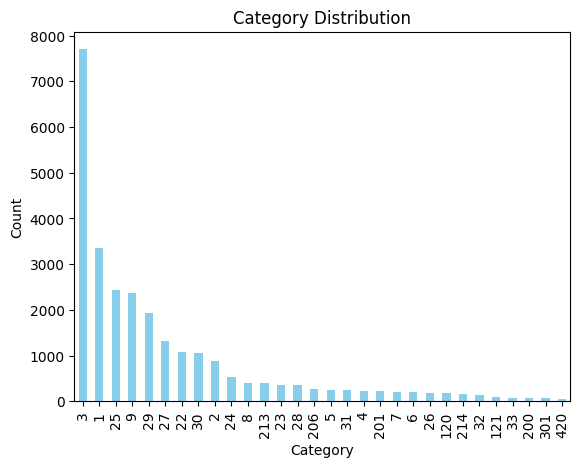

In [54]:
# Count values per category
category_counts = merged_data4['ctypel'].value_counts()

# Plot bar chart
category_counts.plot(kind='bar', color='skyblue')
plt.xlabel("Category")
plt.ylabel("Count")
plt.title("Category Distribution")
plt.show()

In [55]:
# Step 5: Merge data_treatment
merged_data5 = pd.merge(merged_data4, data_treatment, on='plco_id', how='inner')

In [56]:
merged_data5

,reasfolll,reassympl,reassurvl,reasothl,num_cancl,lung_cancer,intstatl_cat,lung_stage,lung_stage_7e,lung_stage_t,...,build_cancers_x,build_incidence_cutoff_x,proc_days,trt_numl,trt_familyl,neoadjuvant,build_y,build_cancers_y,build_incidence_cutoff_y,trt_days
0,0.0,0.0,NaN,1.0,1,1,3,220.0,220.0,300.0,...,1,1,3472,104,2,0,mar22/03.22.22,1,1,3496
1,0.0,0.0,NaN,1.0,1,1,3,220.0,220.0,300.0,...,1,1,3472,113,5,0,mar22/03.22.22,1,1,3496
2,0.0,0.0,NaN,1.0,1,1,3,220.0,220.0,300.0,...,1,1,3472,520,4,0,mar22/03.22.22,1,1,3551
3,0.0,0.0,NaN,1.0,1,1,3,220.0,220.0,300.0,...,1,1,3483,104,2,0,mar22/03.22.22,1,1,3496
4,0.0,0.0,NaN,1.0,1,1,3,220.0,220.0,300.0,...,1,1,3483,113,5,0,mar22/03.22.22,1,1,3496
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49583,1.0,0.0,NaN,0.0,1,1,5,110.0,110.0,100.0,...,1,1,413,113,5,0,mar22/03.22.22,1,1,488
49584,1.0,0.0,NaN,0.0,1,1,5,110.0,110.0,100.0,...,1,1,413,111,2,0,mar22/03.22.22,1,1,488
49585,1.0,0.0,NaN,0.0,1,1,5,110.0,110.0,100.0,...,1,1,453,104,2,0,mar22/03.22.22,1,1,488
49586,1.0,0.0,NaN,0.0,1,1,5,110.0,110.0,100.0,...,1,1,453,113,5,0,mar22/03.22.22,1,1,488


In [67]:
cols = merged_data5.columns

In [68]:
print(cols)

Index(['reasfolll', 'reassympl', 'reassurvl', 'reasothl', 'num_cancl',
       'lung_cancer', 'intstatl_cat', 'lung_stage', 'lung_stage_7e',
       'lung_stage_t',
       ...
       'build_cancers_x', 'build_incidence_cutoff_x', 'proc_days', 'trt_numl',
       'trt_familyl', 'neoadjuvant', 'build_y', 'build_cancers_y',
       'build_incidence_cutoff_y', 'trt_days'],
      dtype='object', length=298)


In [58]:
# Step 4: Merge data_diagnostic
merged_data6 = pd.merge(merged_data5, data_screening, on='plco_id', how='inner')

# # Step 5: Merge data_treatment
# merged_data = pd.merge(merged_data, data_treatment, on='plco_id', how='inner')

# # Step 6: Merge data_complication
# merged_data = pd.merge(merged_data, data_complication, on='plco_id', how='inner')

# # The final merged dataset
# data_overall = merged_data

In [59]:
merged_data6

,reasfolll,reassympl,reassurvl,reasothl,num_cancl,lung_cancer,intstatl_cat,lung_stage,lung_stage_7e,lung_stage_t,...,ccsub_caseset,in25k_ccsub_eligible,build,build_cancers,build_incidence_cutoff,xry_assess_days_q,xry_days,xrydays_pvis1,xrydays_pvis2,xrydays_pvis3
0,0.0,0.0,NaN,1.0,1,1,3,220.0,220.0,300.0,...,NaN,1,mar22/03.22.22,1,1,NaN,81,81,NaN,NaN
1,0.0,0.0,NaN,1.0,1,1,3,220.0,220.0,300.0,...,71,1,mar22/03.22.22,1,1,NaN,408,408,NaN,NaN
2,0.0,0.0,NaN,1.0,1,1,3,220.0,220.0,300.0,...,NaN,1,mar22/03.22.22,1,1,NaN,714,714,NaN,NaN
3,0.0,0.0,NaN,1.0,1,1,3,220.0,220.0,300.0,...,NaN,1,mar22/03.22.22,1,1,NaN,1190,1190,NaN,NaN
4,0.0,0.0,NaN,1.0,1,1,3,220.0,220.0,300.0,...,NaN,1,mar22/03.22.22,1,1,NaN,81,81,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164126,1.0,0.0,NaN,0.0,1,1,5,110.0,110.0,100.0,...,247,1,mar22/03.22.22,1,1,NaN,413,413,NaN,NaN
164127,1.0,0.0,NaN,0.0,1,1,5,110.0,110.0,100.0,...,NaN,1,mar22/03.22.22,1,1,NaN,19,19,NaN,NaN
164128,1.0,0.0,NaN,0.0,1,1,5,110.0,110.0,100.0,...,247,1,mar22/03.22.22,1,1,NaN,413,413,NaN,NaN
164129,1.0,0.0,NaN,0.0,1,1,5,110.0,110.0,100.0,...,NaN,1,mar22/03.22.22,1,1,NaN,19,19,NaN,NaN


In [60]:
# Count null values in a specific column ('ctypel')
null_count = merged_data6['reassurvl'].isnull().sum()

In [62]:
null_count

np.int64(146023)

In [61]:
# Count null values in a specific column ('ctypel')
null_count_ctype_catl = merged_data6['ctype_catl'].isnull().sum()
null_count_ctype_catl

np.int64(0)

In [65]:
# Check for null values
null_counts = merged_data6.isnull().sum()
columns_with_nulls = null_counts[null_counts > 0]
null_counts_sorted = columns_with_nulls.sort_values(ascending=False)
print(null_counts_sorted.to_string())

xrydays_pvis3                 164131
inadfilm_poor                 164131
inad_lost                     164131
inadfilm_ref                  164131
inad_mal                      164131
inadfilm_oth_q3               164131
inad_oth_q2                   164131
inad_oth_q3                   164131
inadfilm_oth_q1               164131
inadfilm_oth_q2               164131
inad_quality_q2               164131
inadfilm_ref_q3               164131
inad_oth_q1                   164131
inadfilm_ref_q1               164131
inadfilm_poor_q3              164131
inadfilm_poor_q2              164131
inadfilm_poor_q1              164131
inad_quality_q3               164131
inadfilm_ref_q2               164131
inad_quality_q1               164131
xryres_qvis2                  164131
inad_mal_q3                   164131
inad_lost_q2                  164131
inad_lost_q3                  164131
as_atelect_loc_pos            164131
as_atelect_loc_side           164131
lung_carcinoid_summstage      164131
a

In [69]:
# List of columns to remove
columns_to_remove = [
    "inad_mal_q2", "lung_carcinoid_summstage", "inad_mal_q1", "examinerid_qvis3",
    "inad_quality_p2", "xryres_qvis2", "xryres_qvis3", "inad_lost_q1", "inad_lost_q2",
    "inad_lost_q3", "inadfilm_ref_p3", "inadfilm_oth_q2", "inadfilm_oth_q3",
    "inad_lost", "inad_mal", "inadfilm_poor_q3", "inadfilm_ref_q1", "inadfilm_ref_q2",
    "inadfilm_ref_q3", "inad_oth_q1", "inad_oth_q2", "inad_oth_q3", "inadfilm_oth_q1",
    "xrydays_pvis3", "examinerid_pvis3", "inad_lost_p1", "inad_lost_p2", "inad_lost_p3",
    "inadfilm_ref_p2", "xryres_pvis3", "inad_oth_p2", "inad_oth_p3", "inadfilm_oth_p2",
    "inadfilm_oth_p3", "inad_mal_p1", "inad_mal_p2", "inad_mal_p3", "inad_quality_p3",
    "inadfilm_poor_p1", "inadfilm_poor_p2", "inadfilm_poor_p3", "inadfilm_ref_p1",
    "inad_mal_q3", "inad_quality_q1", "inad_quality_q2", "inad_quality_q3",
    "inadfilm_poor_q1", "inadfilm_poor_q2", "examinerid_qvis2", "as_atelect_loc",
    "as_atelect_loc_pos", "as_atelect_loc_side", "inadfilm_poor", "inadfilm_ref"
]

# Drop the columns from the DataFrame
merged_data6 = merged_data6.drop(columns=columns_to_remove)

# Verify the updated DataFrame


In [70]:
null_counts = merged_data6.isnull().sum()
columns_with_nulls = null_counts[null_counts > 0]
null_counts_sorted = columns_with_nulls.sort_values(ascending=False)
print(null_counts_sorted.to_string())

xrydays_pvis2                 164061
xryres_pvis2                  164061
examinerid_pvis2              164061
inadfilm_oth                  164059
inadfilm_oth_p1               164011
inad_quality                  163939
inad_oth                      163911
inad_oth_p1                   163911
inad_quality_p1               163891
LOCR2                         163506
LOCR3                         163096
LOCL2                         163028
LOCL1                         162842
LOCR1                         162590
as_hilar_loc                  162485
as_hilar_loc_side             162485
as_hilar_loc_pos              162485
LOCR4                         162062
LOCL3                         161538
as_pleural_loc                161005
as_pleural_loc_pos            161005
as_pleural_loc_side           161005
ccsub_caseset0                160316
TYPEAB                        159647
primary_trtl_small_days       158725
xry_assess_days_q             156852
xryres_qvis1                  156852
e

In [71]:
# List of columns to remove
columns_to_remove2 = [
'examinerid_pvis2', 'xryres_pvis2', 'xrydays_pvis2', 'inadfilm_oth', 'inadfilm_oth_p1', 'inad_quality', 'inad_oth_p1', 'inad_oth', 'inad_quality_p1'
]

In [72]:
# Drop the columns from the DataFrame
merged_data6 = merged_data6.drop(columns=columns_to_remove2)



In [73]:
null_counts = merged_data6.isnull().sum()
columns_with_nulls = null_counts[null_counts > 0]
null_counts_sorted = columns_with_nulls.sort_values(ascending=False)
print(null_counts_sorted.to_string())

LOCR2                         163506
LOCR3                         163096
LOCL2                         163028
LOCL1                         162842
LOCR1                         162590
as_hilar_loc_side             162485
as_hilar_loc                  162485
as_hilar_loc_pos              162485
LOCR4                         162062
LOCL3                         161538
as_pleural_loc_side           161005
as_pleural_loc                161005
as_pleural_loc_pos            161005
ccsub_caseset0                160316
TYPEAB                        159647
primary_trtl_small_days       158725
examinerid_qvis1              156852
xryres_qvis1                  156852
xry_assess_days_q             156852
as_mass_loc_pos               155705
as_mass_loc                   155705
as_mass_loc_side              155705
surg_age                      155001
as_infiltrate_loc             154549
as_infiltrate_loc_side        154549
as_infiltrate_loc_pos         154549
infprosa                      154290
c

In [74]:
# List of columns to remove
columns_to_remove3 = [
"LOCR2", "LOCR3", "LOCL2", "LOCL1", "LOCR1", "LOCR4", "LOCL3", "ccsub_caseset0", "TYPEAB", "examinerid_qvis1", "xry_assess_days_q", "xryres_qvis1", "LOCL5", "reassurvl", "LOCL4", "LOCR7", "LOCL6", "LOCR5", "ccsub_caseset0", "ccsub_caseset1", "ccsub_caseset2", "ccsub_caseset", "ccsub_caseset3", "LOCR8", "LOCR7"

]

In [75]:
# Drop the columns from the DataFrame
merged_data6 = merged_data6.drop(columns=columns_to_remove3)

In [76]:
merged_data6

,reasfolll,reassympl,reasothl,num_cancl,lung_cancer,intstatl_cat,lung_stage,lung_stage_7e,lung_stage_t,lung_stage_n,...,an_cardiac,an_copd,in_ccsub_selection,weight_ccsub_to_elig,in25k_ccsub_eligible,build,build_cancers,build_incidence_cutoff,xry_days,xrydays_pvis1
0,0.0,0.0,1.0,1,1,3,220.0,220.0,300.0,0.0,...,0,0,0,0,1,mar22/03.22.22,1,1,81,81
1,0.0,0.0,1.0,1,1,3,220.0,220.0,300.0,0.0,...,1,0,1,34.9748115066615,1,mar22/03.22.22,1,1,408,408
2,0.0,0.0,1.0,1,1,3,220.0,220.0,300.0,0.0,...,0,0,0,0,1,mar22/03.22.22,1,1,714,714
3,0.0,0.0,1.0,1,1,3,220.0,220.0,300.0,0.0,...,0,0,0,0,1,mar22/03.22.22,1,1,1190,1190
4,0.0,0.0,1.0,1,1,3,220.0,220.0,300.0,0.0,...,0,0,0,0,1,mar22/03.22.22,1,1,81,81
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164126,1.0,0.0,0.0,1,1,5,110.0,110.0,100.0,0.0,...,0,0,1,1,1,mar22/03.22.22,1,1,413,413
164127,1.0,0.0,0.0,1,1,5,110.0,110.0,100.0,0.0,...,0,0,0,0,1,mar22/03.22.22,1,1,19,19
164128,1.0,0.0,0.0,1,1,5,110.0,110.0,100.0,0.0,...,0,0,1,1,1,mar22/03.22.22,1,1,413,413
164129,1.0,0.0,0.0,1,1,5,110.0,110.0,100.0,0.0,...,0,0,0,0,1,mar22/03.22.22,1,1,19,19


In [77]:
# Display all column names
print(merged_data6.columns.tolist())

['reasfolll', 'reassympl', 'reasothl', 'num_cancl', 'lung_cancer', 'intstatl_cat', 'lung_stage', 'lung_stage_7e', 'lung_stage_t', 'lung_stage_n', 'lung_stage_m', 'lung_clinstage', 'lung_clinstage_7e', 'lung_clinstage_t', 'lung_clinstage_n', 'lung_clinstage_m', 'lung_pathstage', 'lung_pathstage_7e', 'lung_pathstage_t', 'lung_pathstage_n', 'lung_pathstage_m', 'lung_cancer_type', 'lung_carcinoid', 'lung_topography', 'lung_grade', 'lung_morphology', 'lung_behavior', 'lung_histtype', 'lung_histtype_cat', 'curative_pneuml', 'curative_wsll', 'curative_chemol', 'curative_radl', 'neoadjuvantl', 'primary_trtl_NSC', 'primary_trtl_small', 'lung_num_heslide_imgs', 'lung_has_deliv_heslide_img', 'lung_exitstat', 'lung_exitage', 'lung_cancer_first', 'lung_seer', 'lung_annyr', 'plco_id', 'lung_exitdays', 'primary_trtl_NSC_days', 'primary_trtl_small_days', 'lung_cancer_diagdays', 'nlst_flag', 'biopllink0', 'biopllink1', 'biopllink2', 'biopllink3', 'lung_mra_stat0', 'lung_mra_stat1', 'lung_mra_stat2', 'l

In [78]:
# List of columns to remove
columns_to_remove4 = [
 'build_y', 'build_cancers_y', 'build_incidence_cutoff_y', 'build_x', 'build_cancers_x', 'build_incidence_cutoff_x','study_yr_y','study_yr','xry_result0', 'xry_result1', 'xry_result2', 'xry_result3', 'xry_prot', 'num_xry_images', 'num_xry_study_yrs', 'has_xry_image0', 'has_xry_image1', 'has_xry_image2', 'has_xry_image3', 'case_study', 'selected_25k_2020', 'eligible_population', 'selected_ccsub_2020', 'ccsub_summary',

]

In [79]:
# Drop the columns from the DataFrame
merged_data6 = merged_data6.drop(columns=columns_to_remove4)

In [80]:
merged_data6

,reasfolll,reassympl,reasothl,num_cancl,lung_cancer,intstatl_cat,lung_stage,lung_stage_7e,lung_stage_t,lung_stage_n,...,an_cardiac,an_copd,in_ccsub_selection,weight_ccsub_to_elig,in25k_ccsub_eligible,build,build_cancers,build_incidence_cutoff,xry_days,xrydays_pvis1
0,0.0,0.0,1.0,1,1,3,220.0,220.0,300.0,0.0,...,0,0,0,0,1,mar22/03.22.22,1,1,81,81
1,0.0,0.0,1.0,1,1,3,220.0,220.0,300.0,0.0,...,1,0,1,34.9748115066615,1,mar22/03.22.22,1,1,408,408
2,0.0,0.0,1.0,1,1,3,220.0,220.0,300.0,0.0,...,0,0,0,0,1,mar22/03.22.22,1,1,714,714
3,0.0,0.0,1.0,1,1,3,220.0,220.0,300.0,0.0,...,0,0,0,0,1,mar22/03.22.22,1,1,1190,1190
4,0.0,0.0,1.0,1,1,3,220.0,220.0,300.0,0.0,...,0,0,0,0,1,mar22/03.22.22,1,1,81,81
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164126,1.0,0.0,0.0,1,1,5,110.0,110.0,100.0,0.0,...,0,0,1,1,1,mar22/03.22.22,1,1,413,413
164127,1.0,0.0,0.0,1,1,5,110.0,110.0,100.0,0.0,...,0,0,0,0,1,mar22/03.22.22,1,1,19,19
164128,1.0,0.0,0.0,1,1,5,110.0,110.0,100.0,0.0,...,0,0,1,1,1,mar22/03.22.22,1,1,413,413
164129,1.0,0.0,0.0,1,1,5,110.0,110.0,100.0,0.0,...,0,0,0,0,1,mar22/03.22.22,1,1,19,19


In [81]:
null_counts = merged_data6.isnull().sum()
columns_with_nulls = null_counts[null_counts > 0]
null_counts_sorted = columns_with_nulls.sort_values(ascending=False)
print(null_counts_sorted.to_string())

as_hilar_loc_side             162485
as_hilar_loc_pos              162485
as_hilar_loc                  162485
as_pleural_loc_pos            161005
as_pleural_loc                161005
as_pleural_loc_side           161005
primary_trtl_small_days       158725
as_mass_loc                   155705
as_mass_loc_side              155705
as_mass_loc_pos               155705
surg_age                      155001
as_infiltrate_loc_pos         154549
as_infiltrate_loc             154549
as_infiltrate_loc_side        154549
infprosa                      154290
as_other_desc                 150017
as_other_loc_side             150017
as_other_loc_pos              150017
as_other_loc                  150017
entrydays_muq                 147999
entryage_muq                  147999
ph_any_muq                    147999
ph_lung_muq                   147999
LOCR6                         147628
hystera                       145158
vasecta                       142786
enlprosa                      140686
l

In [83]:
# Create treatment_category by concatenating med_days and trt_days as strings
merged_data6['treatment_period'] =  merged_data6['med_days'] - merged_data6['trt_days']



In [84]:
# Step 2: Create treatment_category based on diff sign
def categorize(diff_val):
    if diff_val < 0:
        return 'pre-treatment'
    elif diff_val == 0:
        return 'during treatment'
    else:
        return 'post-treatment'

merged_data6['treatment_category'] = merged_data6['treatment_period'].apply(categorize)

In [85]:
columns_to_keep = [
    "ctype_catl", "ctypel", "ctypel_mod", "med_days", "age", "sex", "bmi_curc", "cig_stat", "pack_years",
    "ph_any_trial", "diabetes_f", "hyperten_f", "emphys_f", "bronchit_f", "hearta_f", "bq_returned",
    "proc_numl", "del_invas_cat", "biop", "proc_days", "biopllink0", "reasfolll", "lung_stage",
    "lung_clinstage", "lung_stage_t", "lung_stage_n", "lung_stage_m", "lung_cancer_type",
    "lung_histtype_cat", "lung_behavior", "trt_familyl", "trt_numl", "neoadjuvant", "trt_days", "treatment_period","treatment_category"
]

In [86]:
# Keep only the specified columns
data = merged_data6[columns_to_keep]

In [87]:
data

,ctype_catl,ctypel,ctypel_mod,med_days,age,sex,bmi_curc,cig_stat,pack_years,ph_any_trial,...,lung_stage_m,lung_cancer_type,lung_histtype_cat,lung_behavior,trt_familyl,trt_numl,neoadjuvant,trt_days,treatment_period,treatment_category
0,2,3,3,3479,63,1,3.0,2.0,108.0,1,...,0.0,1.0,2.0,3.0,2,104,0,3496,-17,pre-treatment
1,2,3,3,3479,63,1,3.0,2.0,108.0,1,...,0.0,1.0,2.0,3.0,2,104,0,3496,-17,pre-treatment
2,2,3,3,3479,63,1,3.0,2.0,108.0,1,...,0.0,1.0,2.0,3.0,2,104,0,3496,-17,pre-treatment
3,2,3,3,3479,63,1,3.0,2.0,108.0,1,...,0.0,1.0,2.0,3.0,2,104,0,3496,-17,pre-treatment
4,2,3,3,3479,63,1,3.0,2.0,108.0,1,...,0.0,1.0,2.0,3.0,5,113,0,3496,-17,pre-treatment
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164126,2,3,3,489,63,1,3.0,2.0,21.0,0,...,0.0,1.0,2.0,3.0,2,104,0,488,1,post-treatment
164127,2,3,3,489,63,1,3.0,2.0,21.0,0,...,0.0,1.0,2.0,3.0,5,113,0,488,1,post-treatment
164128,2,3,3,489,63,1,3.0,2.0,21.0,0,...,0.0,1.0,2.0,3.0,5,113,0,488,1,post-treatment
164129,2,3,3,489,63,1,3.0,2.0,21.0,0,...,0.0,1.0,2.0,3.0,2,111,0,488,1,post-treatment


In [88]:
null_counts = data.isnull().sum()
columns_with_nulls = null_counts[null_counts > 0]
null_counts_sorted = columns_with_nulls.sort_values(ascending=False)
print(null_counts_sorted.to_string())

lung_clinstage    8854
bmi_curc          2100
pack_years        1942
bronchit_f        1510
emphys_f          1462
diabetes_f        1462
hearta_f          1462
hyperten_f        1462
cig_stat           934
lung_stage_t       384


In [89]:
# Remove all rows with any missing values
data = data.dropna()

In [90]:
data

,ctype_catl,ctypel,ctypel_mod,med_days,age,sex,bmi_curc,cig_stat,pack_years,ph_any_trial,...,lung_stage_m,lung_cancer_type,lung_histtype_cat,lung_behavior,trt_familyl,trt_numl,neoadjuvant,trt_days,treatment_period,treatment_category
0,2,3,3,3479,63,1,3.0,2.0,108.0,1,...,0.0,1.0,2.0,3.0,2,104,0,3496,-17,pre-treatment
1,2,3,3,3479,63,1,3.0,2.0,108.0,1,...,0.0,1.0,2.0,3.0,2,104,0,3496,-17,pre-treatment
2,2,3,3,3479,63,1,3.0,2.0,108.0,1,...,0.0,1.0,2.0,3.0,2,104,0,3496,-17,pre-treatment
3,2,3,3,3479,63,1,3.0,2.0,108.0,1,...,0.0,1.0,2.0,3.0,2,104,0,3496,-17,pre-treatment
4,2,3,3,3479,63,1,3.0,2.0,108.0,1,...,0.0,1.0,2.0,3.0,5,113,0,3496,-17,pre-treatment
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164126,2,3,3,489,63,1,3.0,2.0,21.0,0,...,0.0,1.0,2.0,3.0,2,104,0,488,1,post-treatment
164127,2,3,3,489,63,1,3.0,2.0,21.0,0,...,0.0,1.0,2.0,3.0,5,113,0,488,1,post-treatment
164128,2,3,3,489,63,1,3.0,2.0,21.0,0,...,0.0,1.0,2.0,3.0,5,113,0,488,1,post-treatment
164129,2,3,3,489,63,1,3.0,2.0,21.0,0,...,0.0,1.0,2.0,3.0,2,111,0,488,1,post-treatment


In [91]:
null_counts = data.isnull().sum()
columns_with_nulls = null_counts[null_counts > 0]
null_counts_sorted = columns_with_nulls.sort_values(ascending=False)
print(null_counts_sorted.to_string())

Series([], )


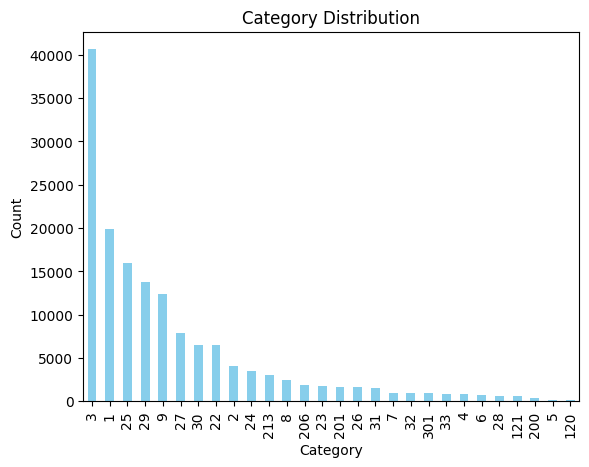

In [92]:
# Count values per category
category_counts = data['ctypel'].value_counts()

# Plot bar chart
category_counts.plot(kind='bar', color='skyblue')
plt.xlabel("Category")
plt.ylabel("Count")
plt.title("Category Distribution")
plt.show()

In [93]:

# Set a fixed random seed for reproducibility
np.random.seed(42)

# Find the minimum class size
min_size = data['ctypel'].value_counts().min()

# Iteratively create balanced subsets
balanced_dfs = []

for _ in range(10):  # Number of iterations
    sampled_df = data.groupby('ctypel', group_keys=False).apply(lambda x: x.sample(n=min_size, replace=False))
    balanced_dfs.append(sampled_df)

# Concatenate all sampled data
final_balanced_df = pd.concat(balanced_dfs)

# Drop duplicates to avoid redundancy
final_balanced_df = final_balanced_df.drop_duplicates()


# Save the balanced dataset
final_balanced_df.to_csv("balanced_plco_complication.csv", index=False)

<ipython-input-93-3b35e308011b>:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_df = data.groupby('ctypel', group_keys=False).apply(lambda x: x.sample(n=min_size, replace=False))
<ipython-input-93-3b35e308011b>:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_df = data.groupby('ctypel', group_keys=False).apply(lambda x: x.sample(n=min_size, replace=False))
<ipython-input-93-3b35e308011b>:

In [5]:
final_balanced_df

,ctype_catl,ctypel,age,sex,bmi_curc,cig_stat,pack_years,ph_any_trial,diabetes_f,hyperten_f,...,lung_clinstage,lung_stage_t,lung_stage_n,lung_stage_m,lung_histtype_cat,trt_familyl,trt_numl,neoadjuvant,treatment_period,treatment_category
0,Major,Bronchopulmonary Fistula,67,Male,18.5-25,Former Cigarette Smoker,45.0,No,No,No,...,Stage IA,T2,N0,M0,Adenocarcinoma,Chemotherapy,"Systemic treatment, NOS",Not neoadjuvant,-172,pre-treatment
1,Major,Pulmonary Embolus / Emboli,69,Female,25-30,Never Smoked Cigarettes,0.0,No,No,No,...,Stage IA,T1,N0,M0,Bronchiolo-alveolar carcinoma,Non-curative treatment,Lymphadenectomy / lymph node sampling,Not neoadjuvant,20,post-treatment
2,Intermediate,Infectious,68,Male,30+,Former Cigarette Smoker,49.0,No,No,No,...,Stage IA,T1,N0,M0,Squamous cell carcinoma,Non-curative treatment,Lymphadenectomy / lymph node sampling,Not neoadjuvant,36,post-treatment
3,Major,Bronchopulmonary Fistula,71,Male,25-30,Former Cigarette Smoker,69.0,No,No,No,...,Stage IV,T3,N1,M1,Bronchiolo-alveolar carcinoma,Pneumonectomy or bilobectomy,Pneumonectomy,Not neoadjuvant,10,during treatment
4,Major,Cardiac Emergencies,59,Female,18.5-25,Current Cigarette Smoker,120.0,No,No,No,...,Stage IIIB,T3,N1,M0,Squamous cell carcinoma,Non-curative treatment,Lymphadenectomy / lymph node sampling,Not neoadjuvant,92,post-treatment
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26573,Intermediate,Infectious,65,Male,30+,Current Cigarette Smoker,150.0,No,No,Yes,...,Stage IA,T1,N0,M0,Squamous cell carcinoma,Non-curative treatment,Lymphadenectomy / lymph node sampling,Not neoadjuvant,9,during treatment
26574,Intermediate,Cardiac Arrhythmia,63,Male,18.5-25,Current Cigarette Smoker,46.0,No,No,No,...,Stage IA,T1,N0,M0,Squamous cell carcinoma,"Wedge resection, segmental resection, or lobec...",Lobectomy,Not neoadjuvant,0,during treatment
26575,Major,Respiratory Arrest,62,Male,18.5-25,Current Cigarette Smoker,69.0,No,No,No,...,Stage IV,T2,N0,M1,Squamous cell carcinoma,Pneumonectomy or bilobectomy,Pneumonectomy,Not neoadjuvant,17,post-treatment
26576,Major,Cerebral vascular accident (CVA) / Stroke,68,Male,30+,Former Cigarette Smoker,49.0,No,No,No,...,Stage IA,T1,N0,M0,Squamous cell carcinoma,"Wedge resection, segmental resection, or lobec...",Lobectomy,Not neoadjuvant,16,post-treatment


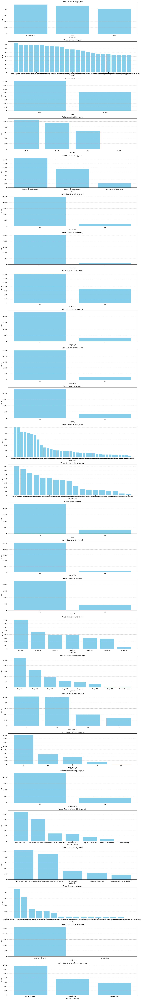

In [7]:
# Identify categorical columns
categorical_cols = final_balanced_df.select_dtypes(include=['object']).columns

# Create subplots
fig, axes = plt.subplots(nrows=len(categorical_cols), figsize=(15, 4 * len(categorical_cols)))

# If only one categorical column, make sure axes is iterable
if len(categorical_cols) == 1:
    axes = [axes]

# Plot each categorical column
for ax, col in zip(axes, categorical_cols):
    value_counts = final_balanced_df[col].value_counts()
    ax.bar(value_counts.index, value_counts.values, color='skyblue')
    ax.set_title(f'Value Counts of {col}')
    ax.set_xlabel(col)
    ax.set_ylabel('Count')
    ax.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

In [9]:
final_balanced_df.columns

Index(['ctype_catl', 'ctypel', 'age', 'sex', 'bmi_curc', 'cig_stat',
       'pack_years', 'ph_any_trial', 'diabetes_f', 'hyperten_f', 'emphys_f',
       'bronchit_f', 'hearta_f', 'bq_returned', 'proc_numl', 'del_invas_cat',
       'biop', 'proc_days', 'biopllink0', 'reasfolll', 'lung_stage',
       'lung_clinstage', 'lung_stage_t', 'lung_stage_n', 'lung_stage_m',
       'lung_histtype_cat', 'trt_familyl', 'trt_numl', 'neoadjuvant',
       'treatment_period', 'treatment_category'],
      dtype='object')

In [12]:
df = final_balanced_df

In [13]:
# Data types and non-null counts
df.info()

# Summary statistics of numeric columns
df.describe()

# Summary statistics for categorical columns
df.describe(include=['object'])


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26578 entries, 0 to 26577
Data columns (total 31 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ctype_catl          26578 non-null  object 
 1   ctypel              26578 non-null  object 
 2   age                 26578 non-null  int64  
 3   sex                 26578 non-null  object 
 4   bmi_curc            26578 non-null  object 
 5   cig_stat            26578 non-null  object 
 6   pack_years          26578 non-null  float64
 7   ph_any_trial        26578 non-null  object 
 8   diabetes_f          26578 non-null  object 
 9   hyperten_f          26578 non-null  object 
 10  emphys_f            26578 non-null  object 
 11  bronchit_f          26578 non-null  object 
 12  hearta_f            26578 non-null  object 
 13  bq_returned         26578 non-null  int64  
 14  proc_numl           26578 non-null  object 
 15  del_invas_cat       26578 non-null  object 
 16  biop

,ctype_catl,ctypel,sex,bmi_curc,cig_stat,ph_any_trial,diabetes_f,hyperten_f,emphys_f,bronchit_f,...,lung_stage,lung_clinstage,lung_stage_t,lung_stage_n,lung_stage_m,lung_histtype_cat,trt_familyl,trt_numl,neoadjuvant,treatment_category
count,26578,26578,26578,26578,26578,26578,26578,26578,26578,26578,...,26578,26578,26578,26578,26578,26578,26578,26578,26578,26578
unique,3,23,2,4,3,2,2,2,2,2,...,7,8,4,5,2,7,5,16,2,3
top,Intermediate,Other Specify,Male,25-30,Former Cigarette Smoker,No,No,No,No,No,...,Stage IA,Stage IA,T1,N0,M0,Adenocarcinoma,Non-curative treatment,Lymphadenectomy / lymph node sampling,Not neoadjuvant,during treatment
freq,9489,1491,16204,10604,14810,25002,25156,18212,23752,24583,...,8088,10706,10156,15992,22687,10872,10358,9037,25873,13672


In [96]:
# For missingno and pandas-profiling (optional)
!pip install missingno
!pip install pandas-profiling


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 262.6/262.6 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 56.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.4/102.4 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 309.8/309.8 kB 22.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 41.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 19.9 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=e1c0c118dac4bb57cbf79a458be5dd0716592c06568aad69cec61507a040b84a
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Successfully built htmlmin
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 3.0.2
    Uninstalling MarkupSafe-3.0.2:
      Successfully uninstalled MarkupSafe-3.0.2
  Attempting uninstall: 

In [100]:
# Missing values count
print(df.isnull().sum())




ctype_catl            0
ctypel                0
age                   0
sex                   0
bmi_curc              0
cig_stat              0
pack_years            0
ph_any_trial          0
diabetes_f            0
hyperten_f            0
emphys_f              0
bronchit_f            0
hearta_f              0
bq_returned           0
proc_numl             0
del_invas_cat         0
biop                  0
proc_days             0
biopllink0            0
reasfolll             0
lung_stage            0
lung_clinstage        0
lung_stage_t          0
lung_stage_n          0
lung_stage_m          0
lung_histtype_cat     0
trt_familyl           0
trt_numl              0
neoadjuvant           0
treatment_period      0
treatment_category    0
dtype: int64


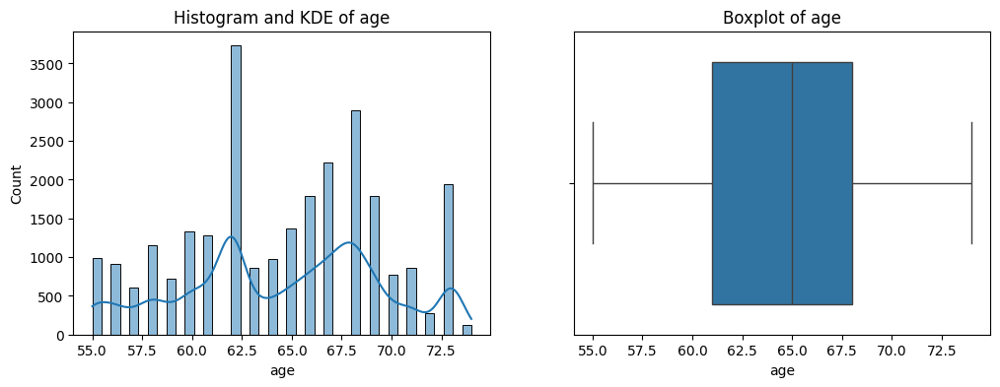

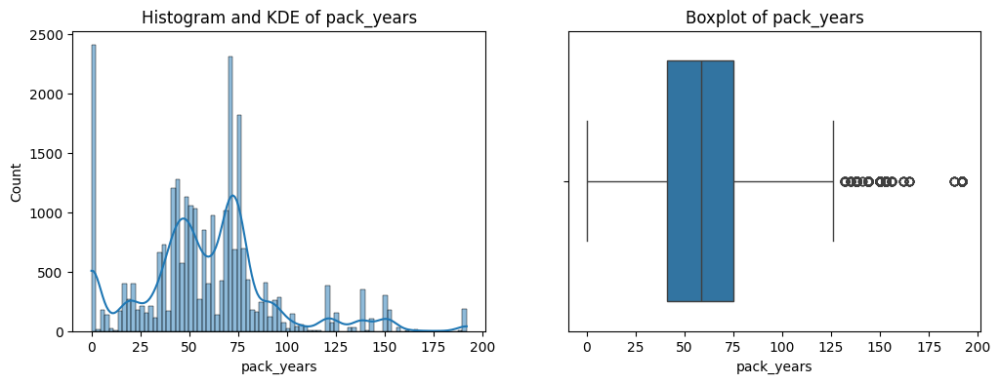

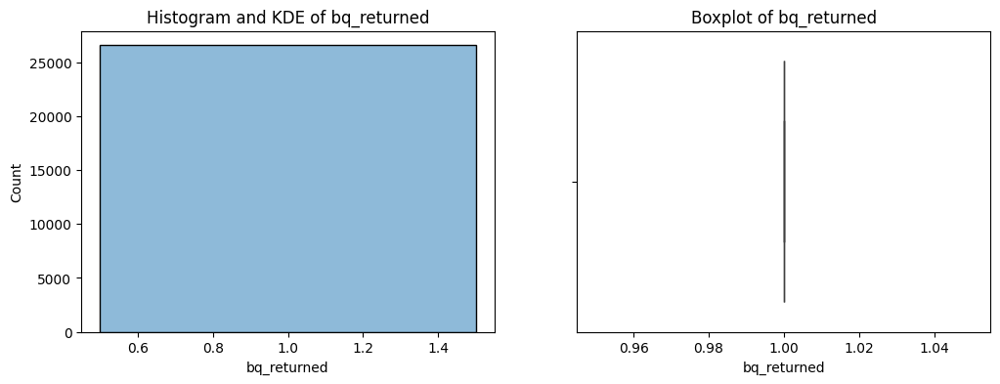

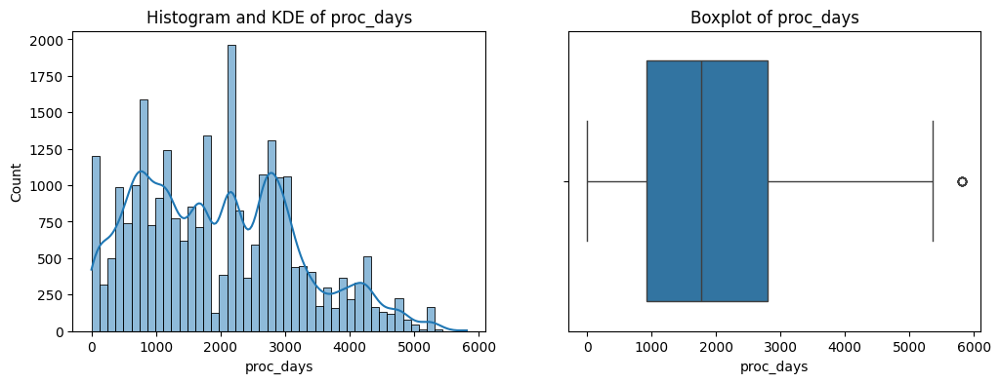

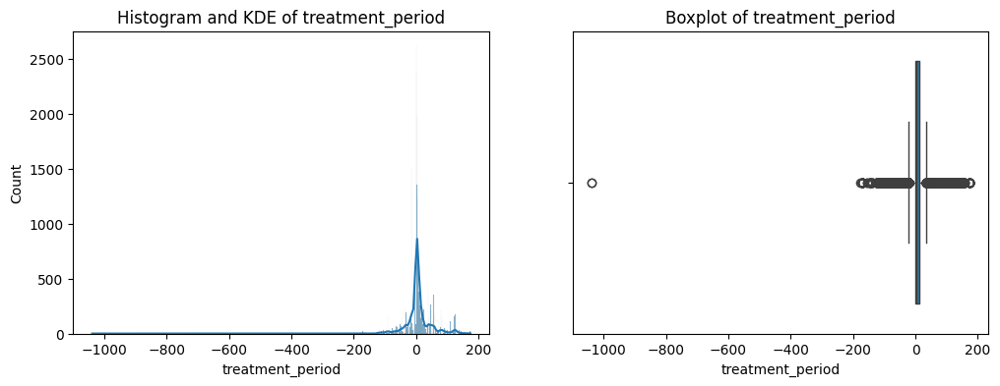

In [101]:
numeric_cols = df.select_dtypes(include=np.number).columns.tolist()

for col in numeric_cols:
    plt.figure(figsize=(12,4))
    plt.subplot(1,2,1)
    sns.histplot(df[col].dropna(), kde=True)
    plt.title(f'Histogram and KDE of {col}')

    plt.subplot(1,2,2)
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot of {col}')

    plt.show()


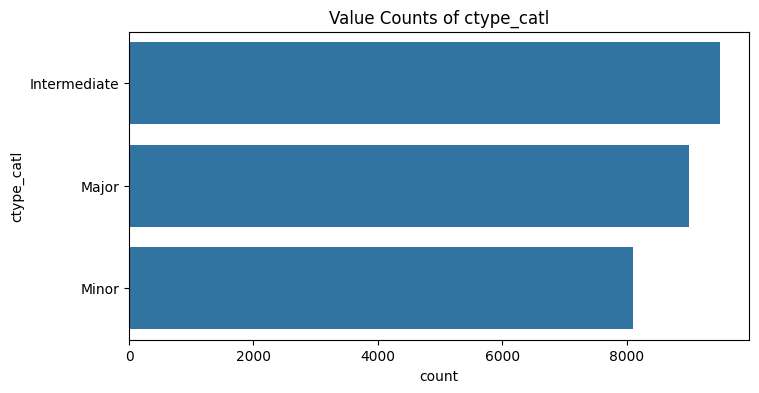

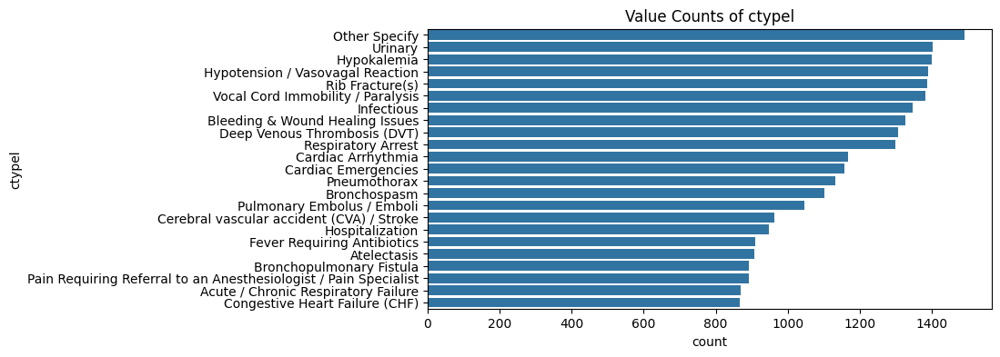

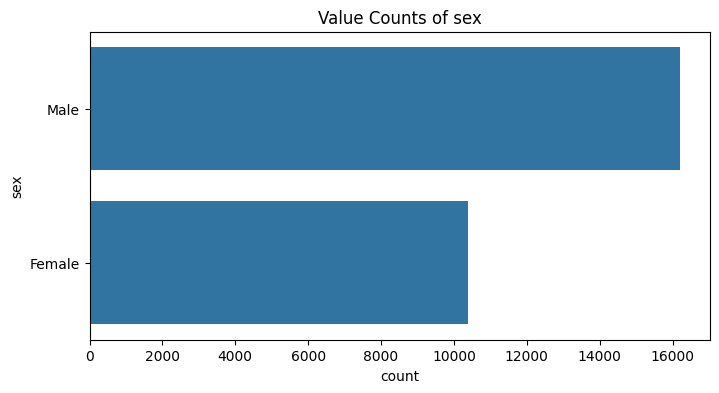

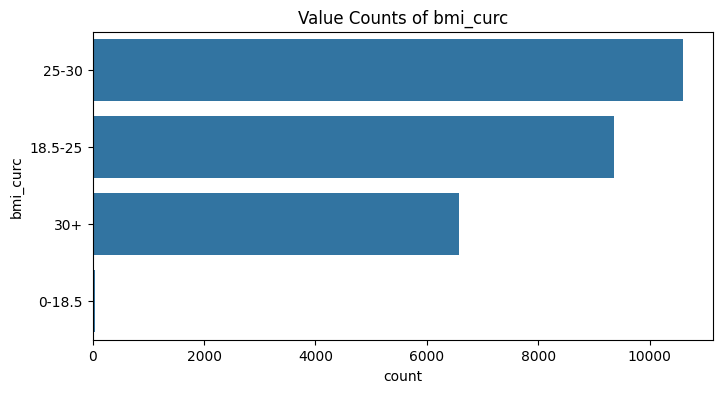

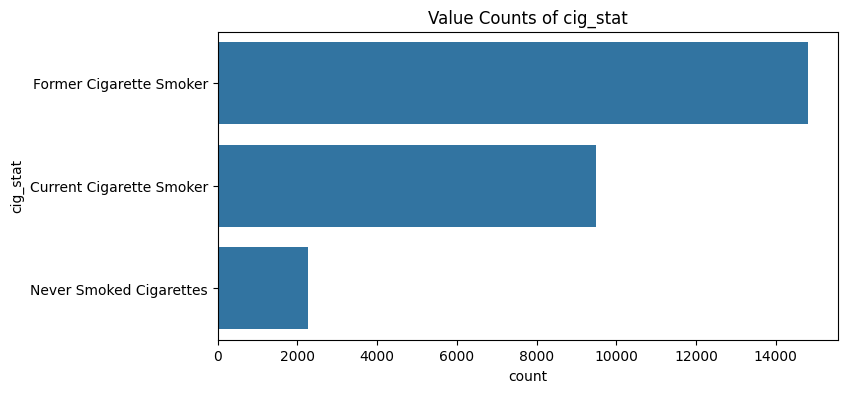

...

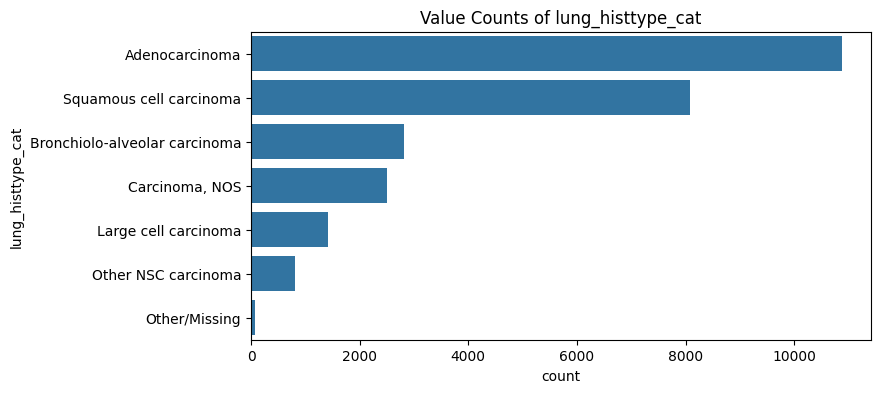

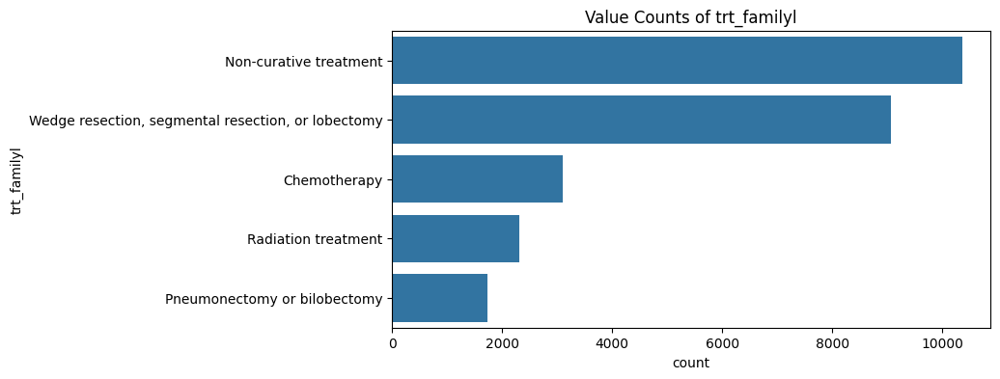

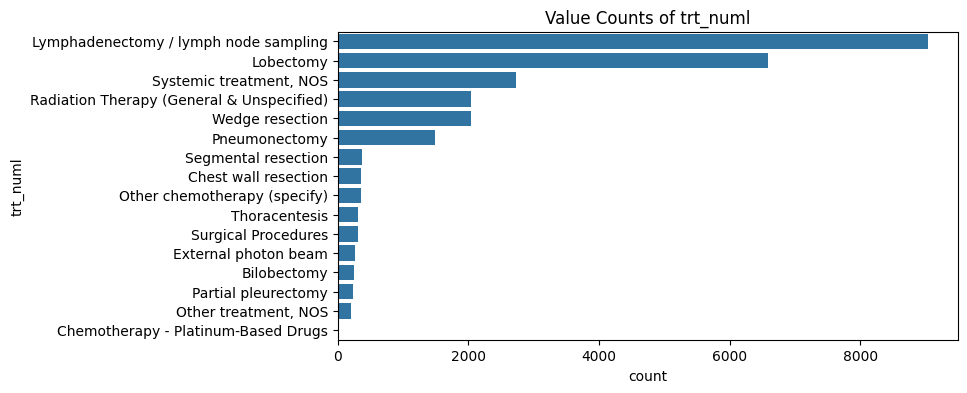

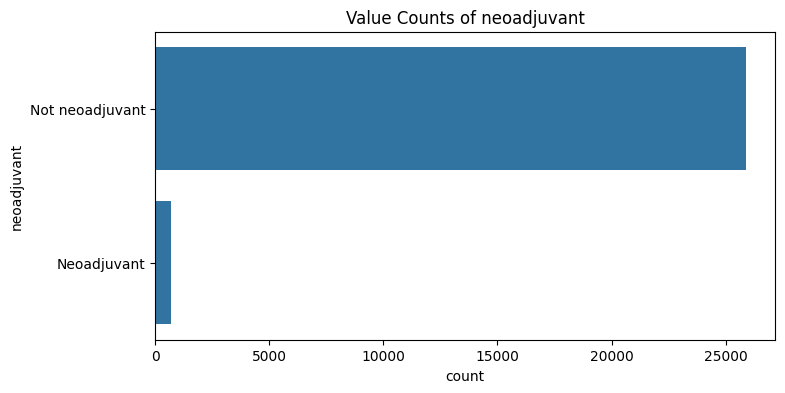

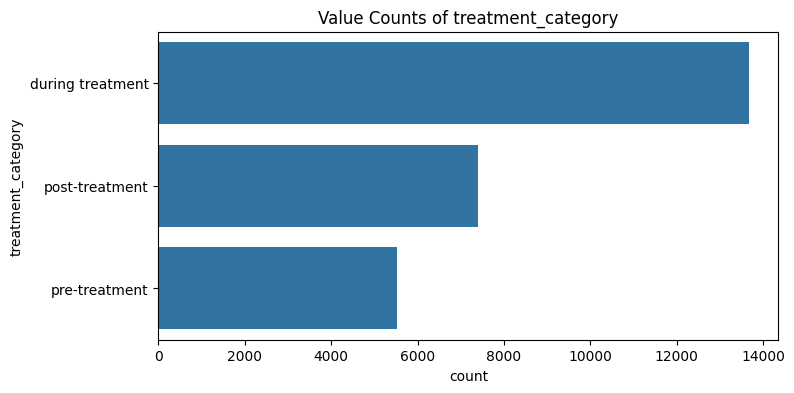

In [102]:
cat_cols = df.select_dtypes(include='object').columns.tolist()

for col in cat_cols:
    plt.figure(figsize=(8,4))
    sns.countplot(y=col, data=df, order=df[col].value_counts().index)
    plt.title(f'Value Counts of {col}')
    plt.show()


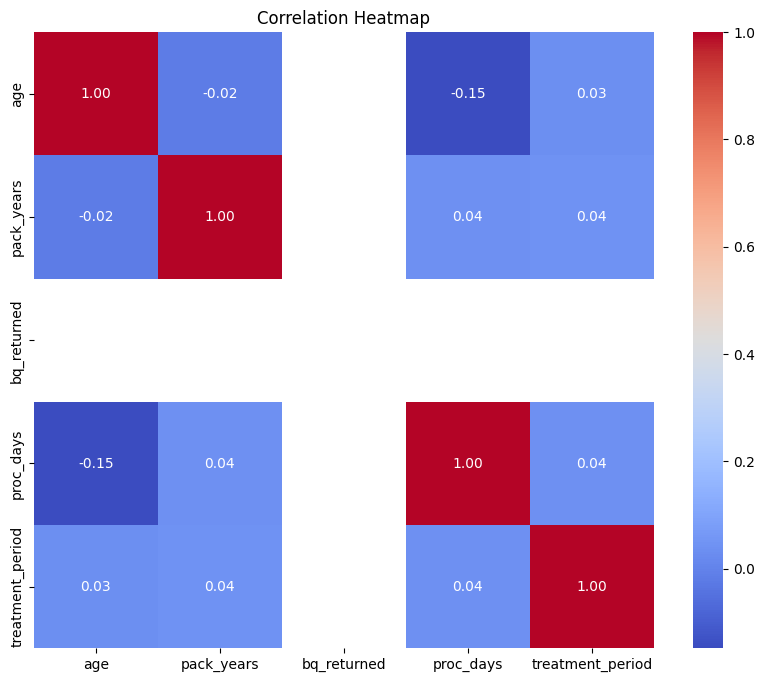

In [103]:
plt.figure(figsize=(10,8))
corr = df[numeric_cols].corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


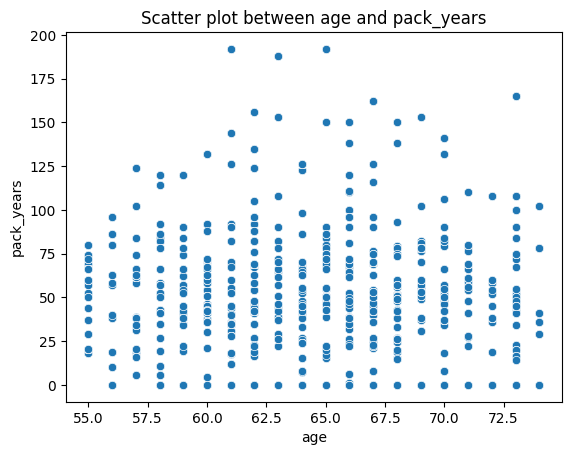

In [104]:
# Example scatter plot for 2 numeric variables
sns.scatterplot(data=df, x=numeric_cols[0], y=numeric_cols[1])
plt.title(f'Scatter plot between {numeric_cols[0]} and {numeric_cols[1]}')
plt.show()


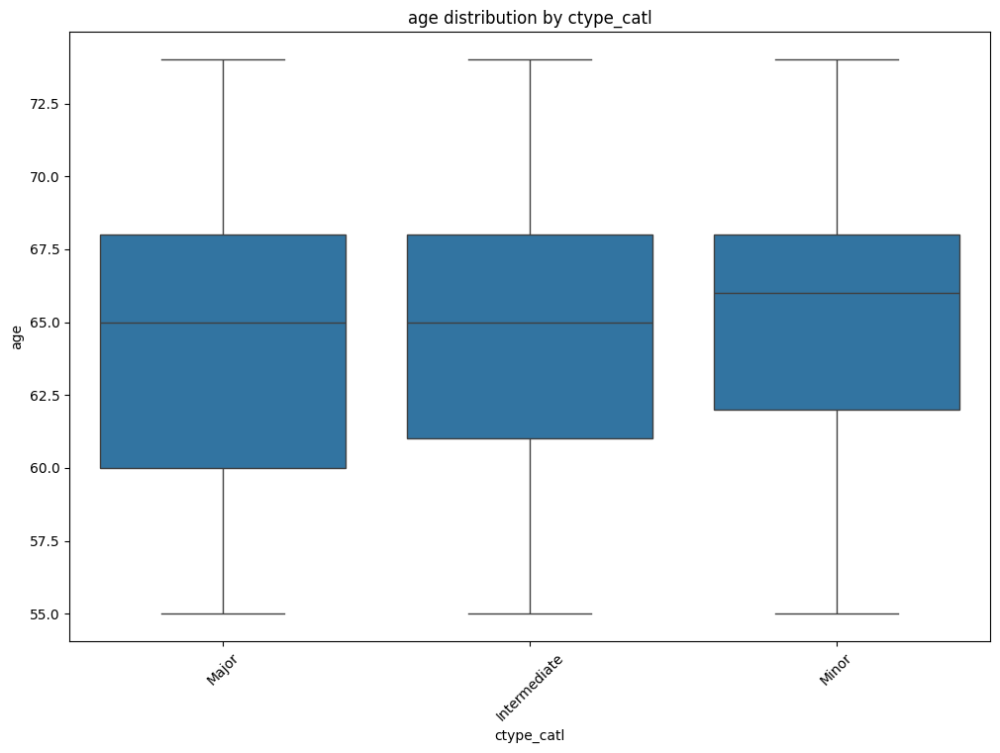

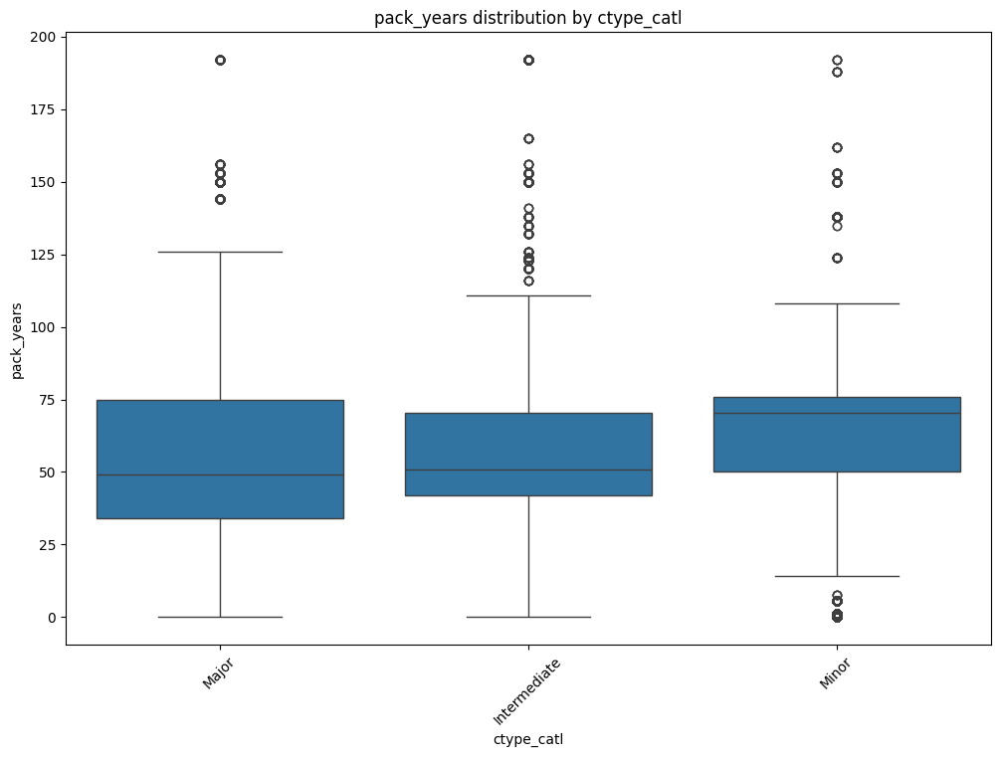

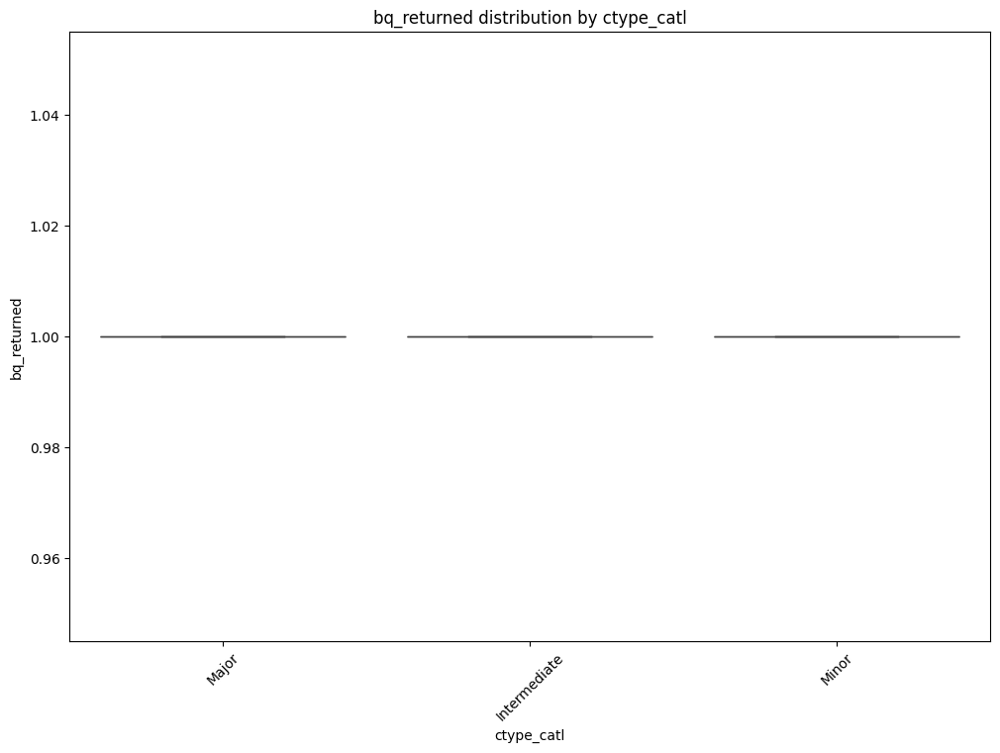

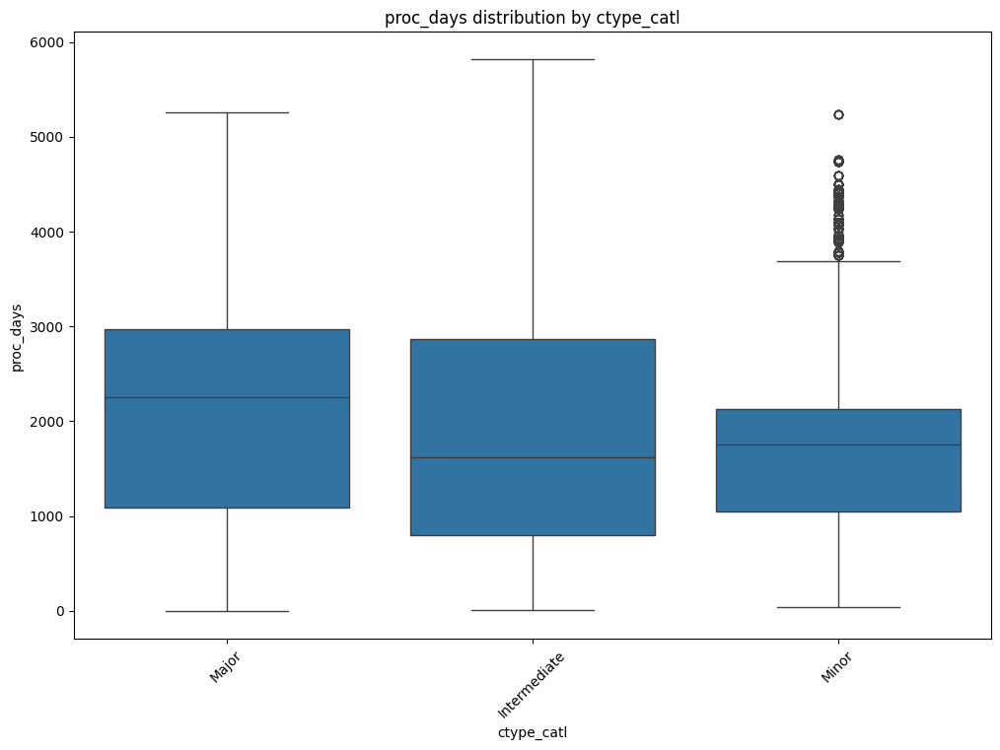

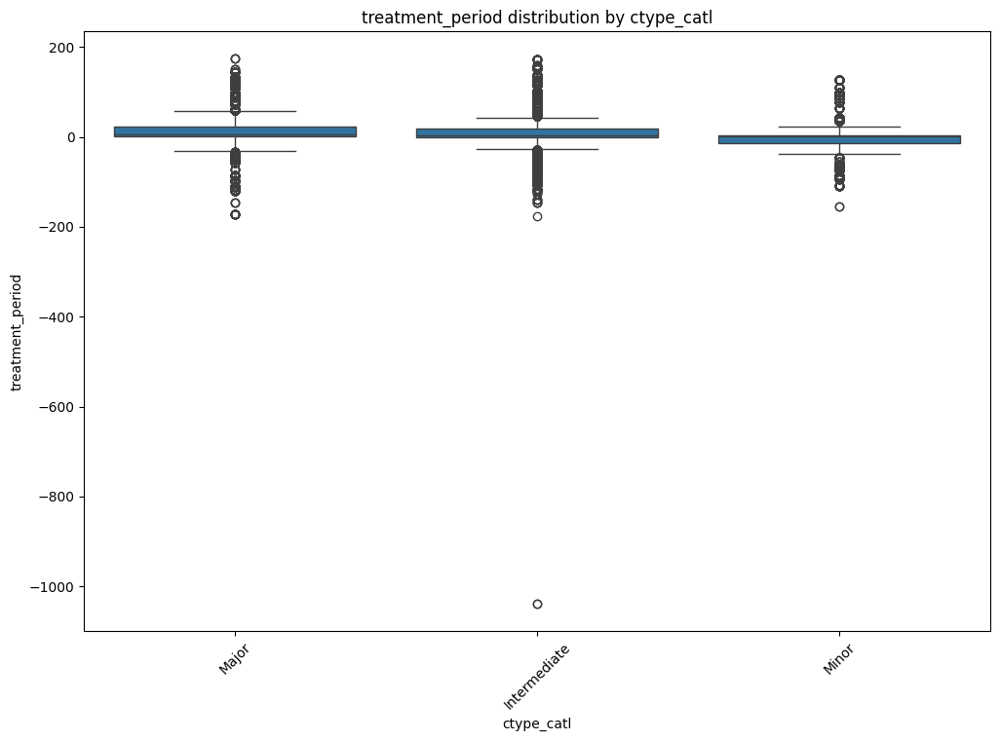

...

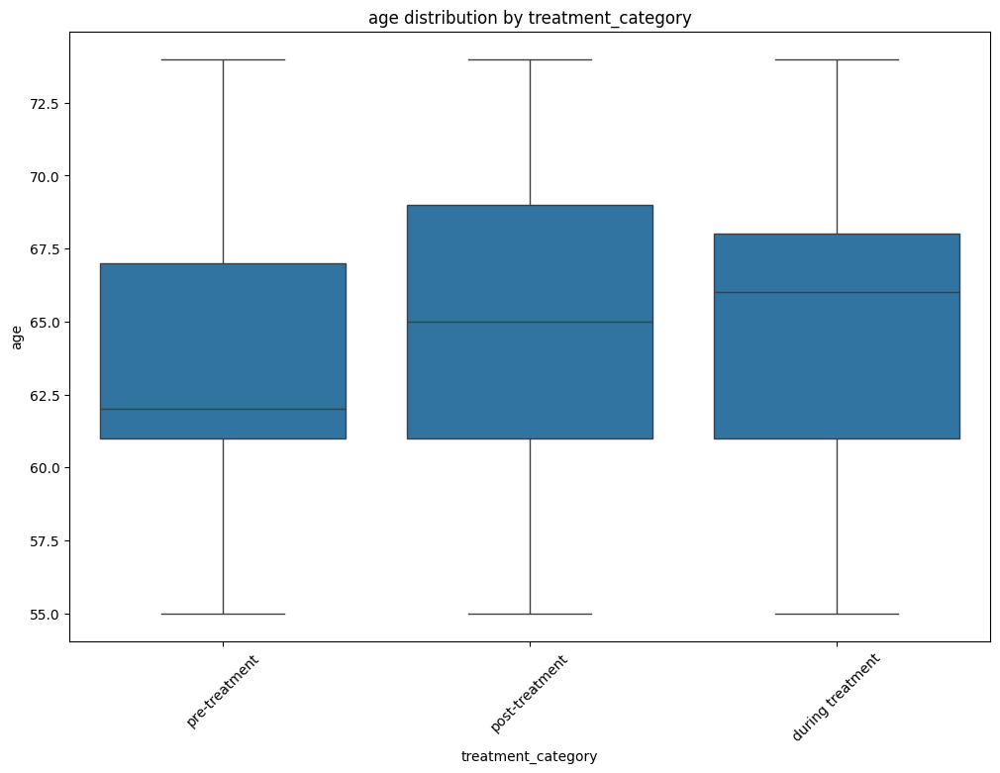

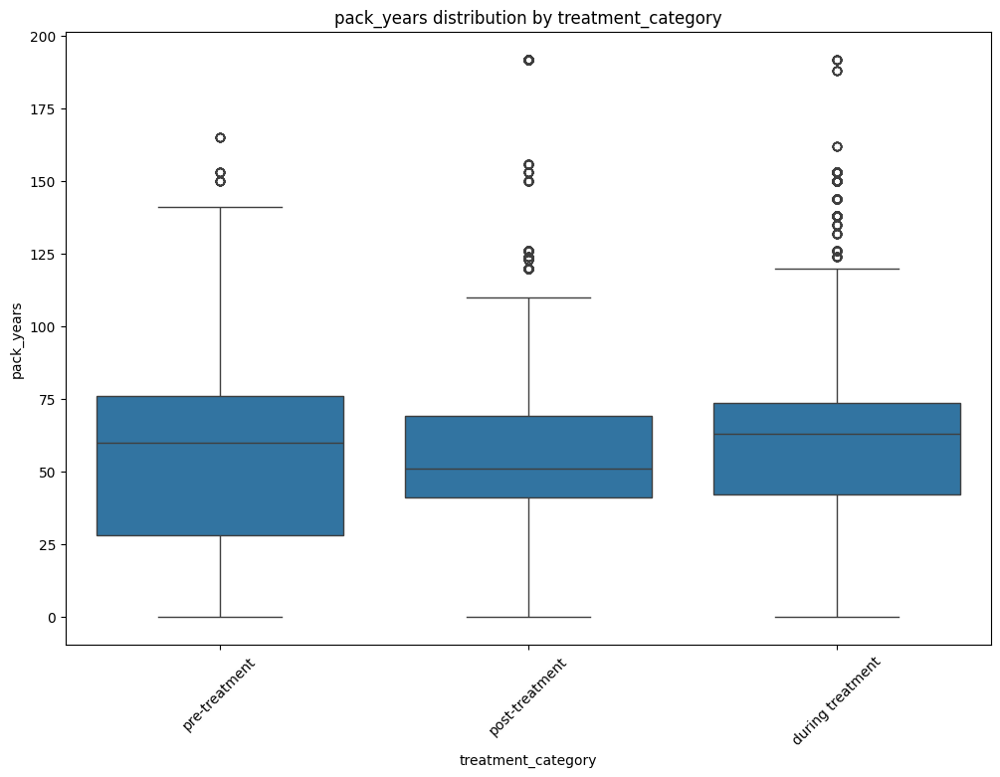

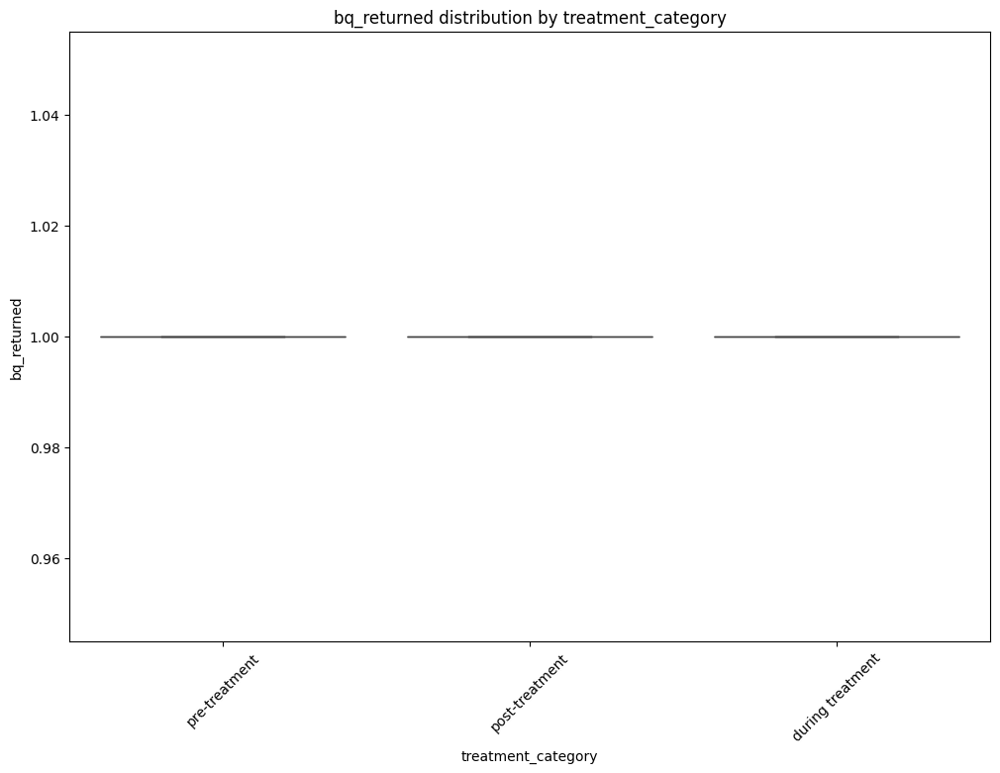

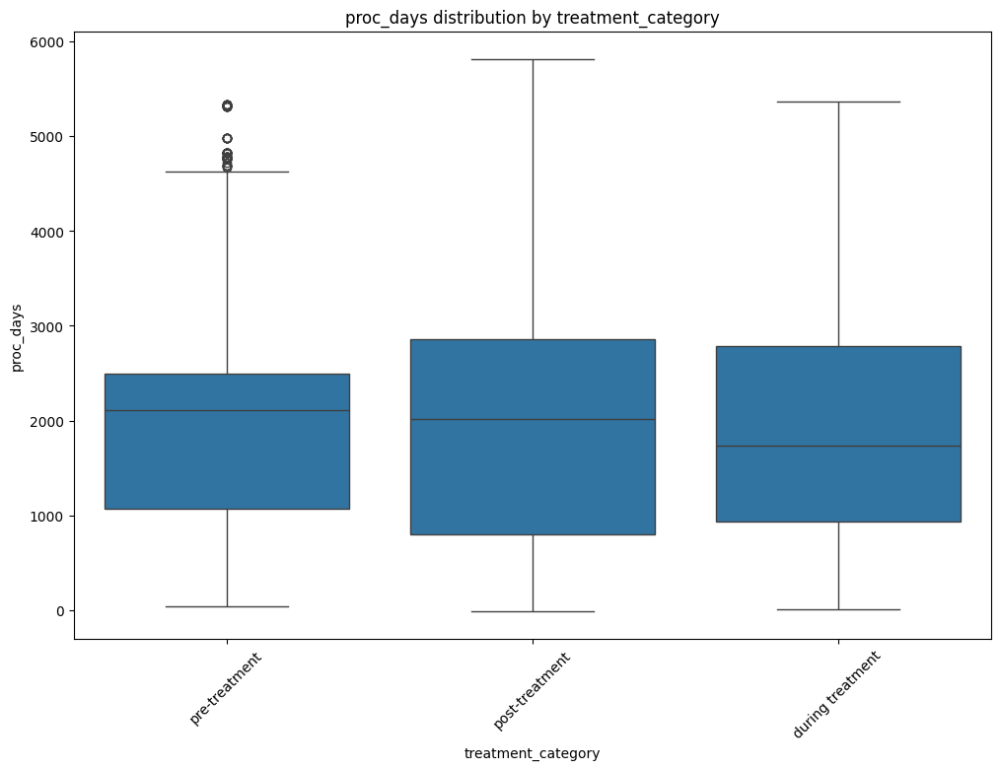

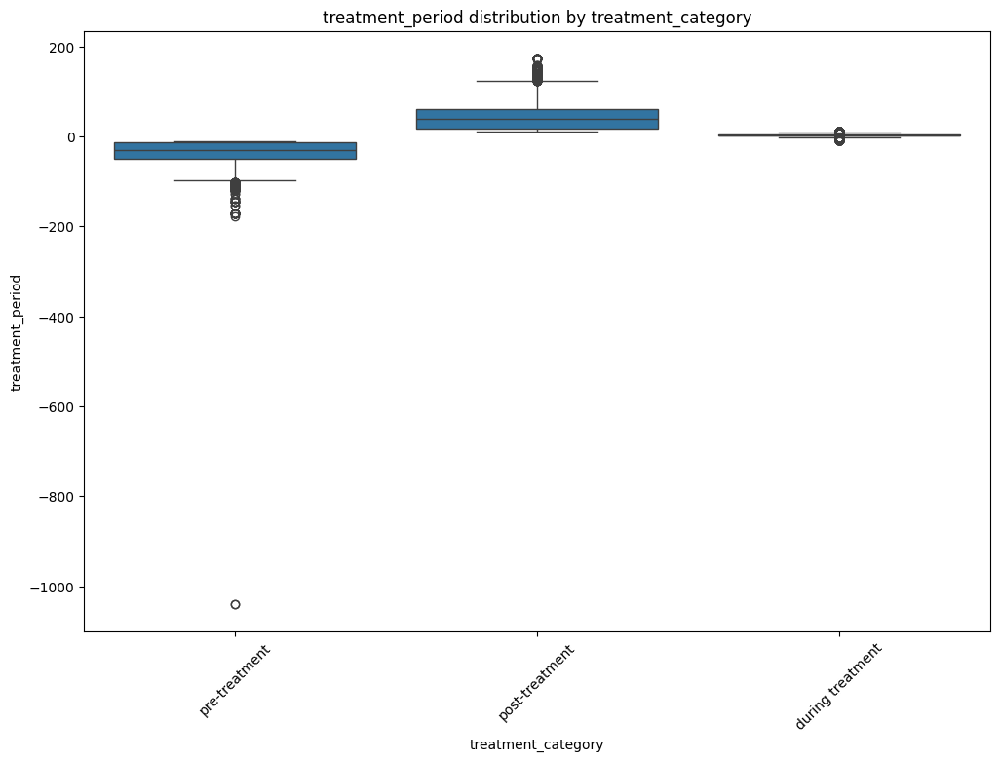

In [108]:
for col in cat_cols:
    for num_col in numeric_cols:
        plt.figure(figsize=(10,13))
        sns.boxplot(x=col, y=num_col, data=df)
        plt.title(f'{num_col} distribution by {col}')
        plt.xticks(rotation=45)
        plt.show()


ctypel        Acute / Chronic Respiratory Failure  Atelectasis  \
ctype_catl                                                       
Intermediate                                    0            0   
Major                                         868            0   
Minor                                           0          906   

ctypel        Bleeding & Wound Healing Issues  Bronchopulmonary Fistula  \
ctype_catl                                                                
Intermediate                              419                         0   
Major                                     597                       893   
Minor                                     311                         0   

ctypel        Bronchospasm  Cardiac Arrhythmia  Cardiac Emergencies  \
ctype_catl                                                            
Intermediate             0                1166                    0   
Major                    0                   0                 1156   
Minor    

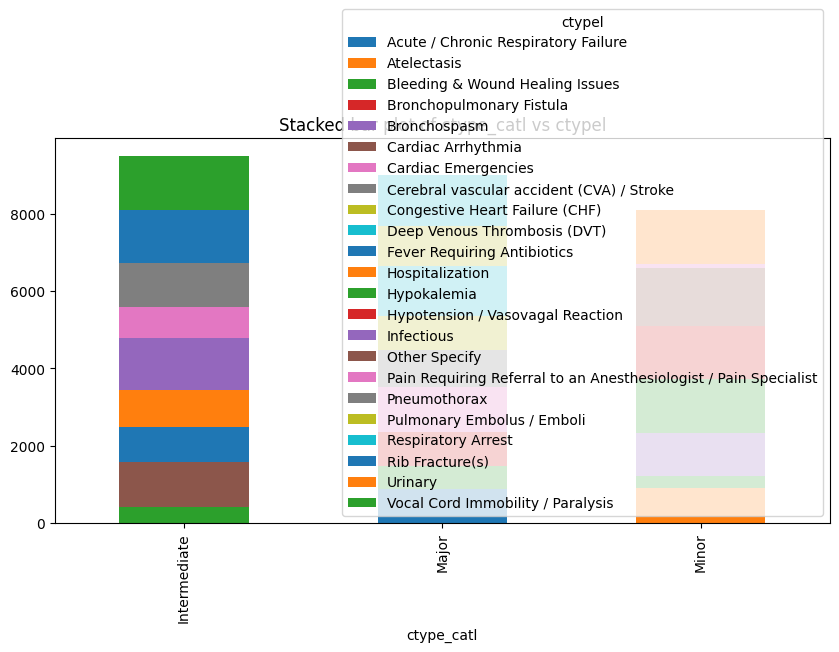

In [106]:
# Contingency table example
if len(cat_cols) >= 2:
    ct = pd.crosstab(df[cat_cols[0]], df[cat_cols[1]])
    print(ct)

    ct.plot(kind='bar', stacked=True, figsize=(10,5))
    plt.title(f'Stacked bar plot of {cat_cols[0]} vs {cat_cols[1]}')
    plt.show()


In [107]:
df

,ctype_catl,ctypel,age,sex,bmi_curc,cig_stat,pack_years,ph_any_trial,diabetes_f,hyperten_f,...,lung_clinstage,lung_stage_t,lung_stage_n,lung_stage_m,lung_histtype_cat,trt_familyl,trt_numl,neoadjuvant,treatment_period,treatment_category
0,Major,Bronchopulmonary Fistula,67,Male,18.5-25,Former Cigarette Smoker,45.0,No,No,No,...,Stage IA,T2,N0,M0,Adenocarcinoma,Chemotherapy,"Systemic treatment, NOS",Not neoadjuvant,-172,pre-treatment
1,Major,Pulmonary Embolus / Emboli,69,Female,25-30,Never Smoked Cigarettes,0.0,No,No,No,...,Stage IA,T1,N0,M0,Bronchiolo-alveolar carcinoma,Non-curative treatment,Lymphadenectomy / lymph node sampling,Not neoadjuvant,20,post-treatment
2,Intermediate,Infectious,68,Male,30+,Former Cigarette Smoker,49.0,No,No,No,...,Stage IA,T1,N0,M0,Squamous cell carcinoma,Non-curative treatment,Lymphadenectomy / lymph node sampling,Not neoadjuvant,36,post-treatment
3,Major,Bronchopulmonary Fistula,71,Male,25-30,Former Cigarette Smoker,69.0,No,No,No,...,Stage IV,T3,N1,M1,Bronchiolo-alveolar carcinoma,Pneumonectomy or bilobectomy,Pneumonectomy,Not neoadjuvant,10,during treatment
4,Major,Cardiac Emergencies,59,Female,18.5-25,Current Cigarette Smoker,120.0,No,No,No,...,Stage IIIB,T3,N1,M0,Squamous cell carcinoma,Non-curative treatment,Lymphadenectomy / lymph node sampling,Not neoadjuvant,92,post-treatment
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26573,Intermediate,Infectious,65,Male,30+,Current Cigarette Smoker,150.0,No,No,Yes,...,Stage IA,T1,N0,M0,Squamous cell carcinoma,Non-curative treatment,Lymphadenectomy / lymph node sampling,Not neoadjuvant,9,during treatment
26574,Intermediate,Cardiac Arrhythmia,63,Male,18.5-25,Current Cigarette Smoker,46.0,No,No,No,...,Stage IA,T1,N0,M0,Squamous cell carcinoma,"Wedge resection, segmental resection, or lobec...",Lobectomy,Not neoadjuvant,0,during treatment
26575,Major,Respiratory Arrest,62,Male,18.5-25,Current Cigarette Smoker,69.0,No,No,No,...,Stage IV,T2,N0,M1,Squamous cell carcinoma,Pneumonectomy or bilobectomy,Pneumonectomy,Not neoadjuvant,17,post-treatment
26576,Major,Cerebral vascular accident (CVA) / Stroke,68,Male,30+,Former Cigarette Smoker,49.0,No,No,No,...,Stage IA,T1,N0,M0,Squamous cell carcinoma,"Wedge resection, segmental resection, or lobec...",Lobectomy,Not neoadjuvant,16,post-treatment
